In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
df = pd.read_csv("water_potability(1).csv")

In [ ]:
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890456,20791.31898,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.05786,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.54173,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.41744,8.059332,356.886136,363.266516,18.436525,100.341674,4.628771,0
4,9.092223,181.101509,17978.98634,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [ ]:
df.shape

(3276, 10)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [ ]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690300,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833605,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762125,8.114887,359.950170,481.792305,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196010,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [ ]:
df.isna().sum()

,0
ph,491
Hardness,0
Solids,0
Chloramines,0
Sulfate,781
Conductivity,0
Organic_carbon,0
Trihalomethanes,162
Turbidity,0
Potability,0


<Axes: >

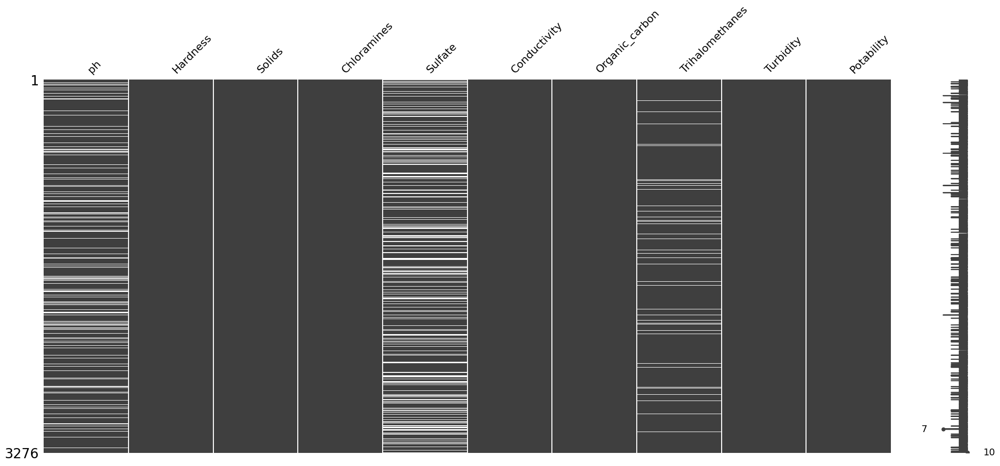

In [ ]:
msno.matrix(df)

In [ ]:
df['ph'] = df['ph'].fillna(df.groupby(['Potability'])['ph'].transform('mean'))
df['Sulfate'] = df['Sulfate'].fillna(df.groupby(['Potability'])['Sulfate'].transform('mean'))
df['Trihalomethanes'] = df['Trihalomethanes'].fillna(df.groupby(['Potability'])['Trihalomethanes'].transform('mean'))

In [ ]:
df.duplicated().sum()

0

**Blue-> Not Potable
Orange-> Potable**

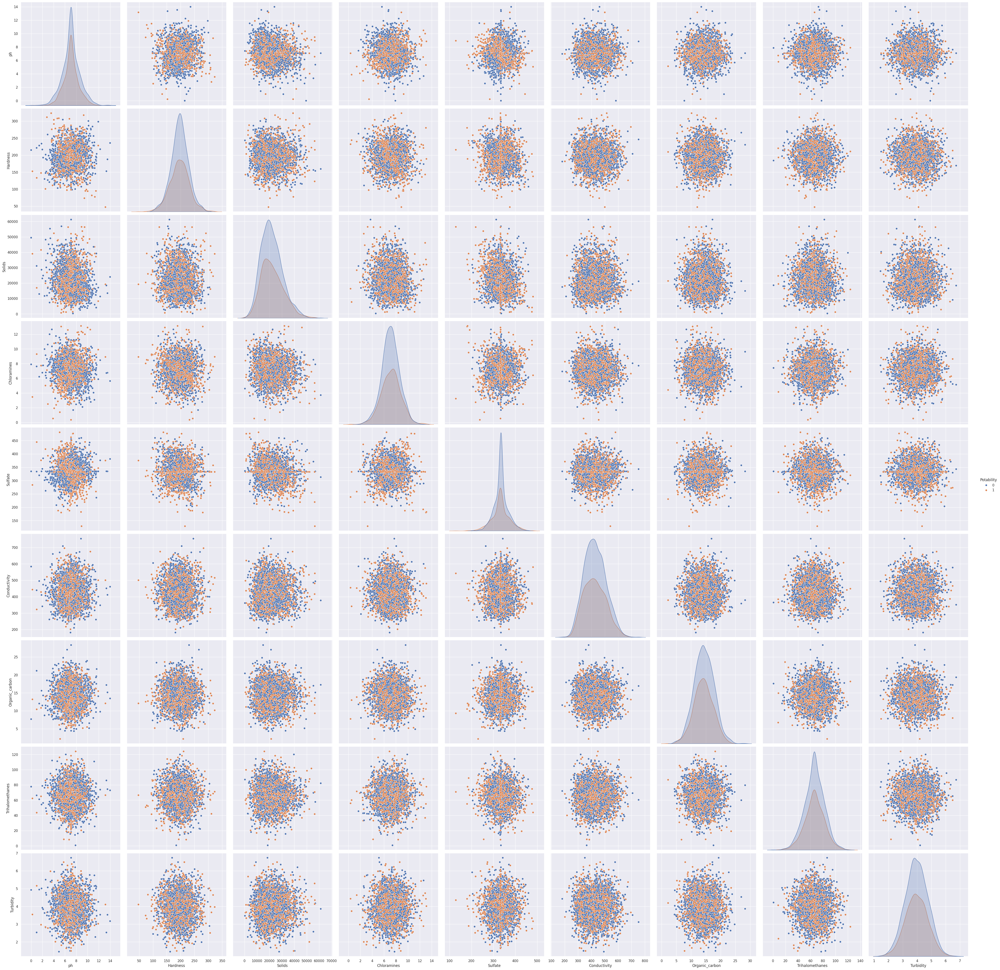

In [ ]:
sns.set()
sns.pairplot(df, hue="Potability", height=5)

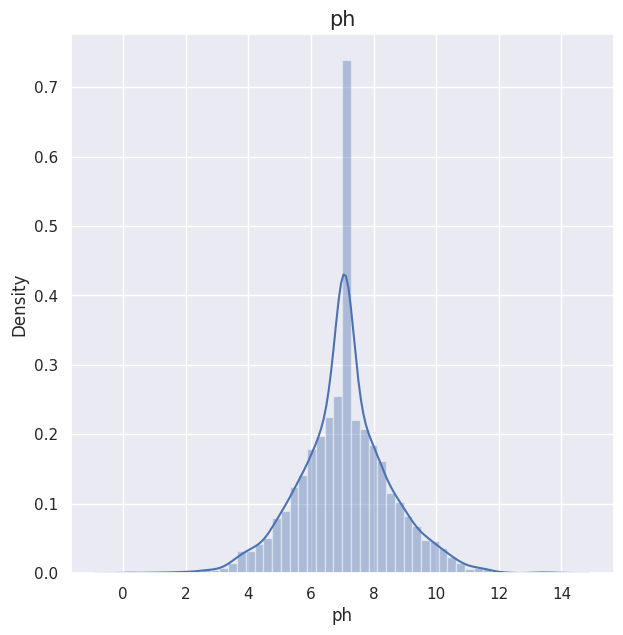

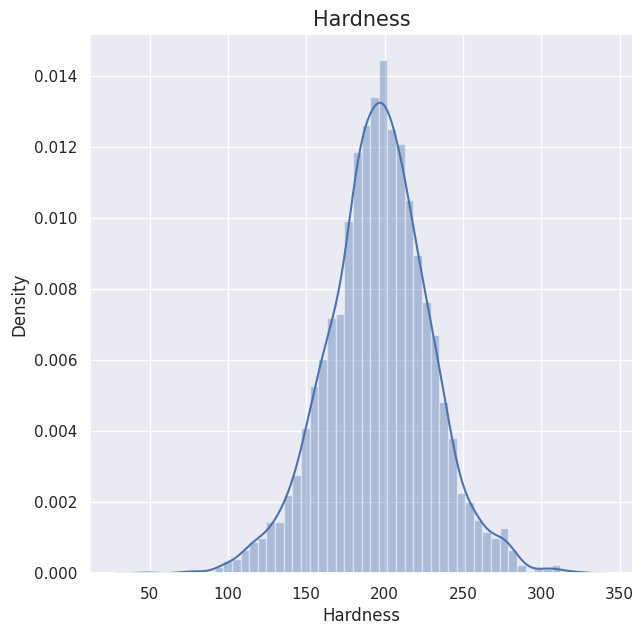

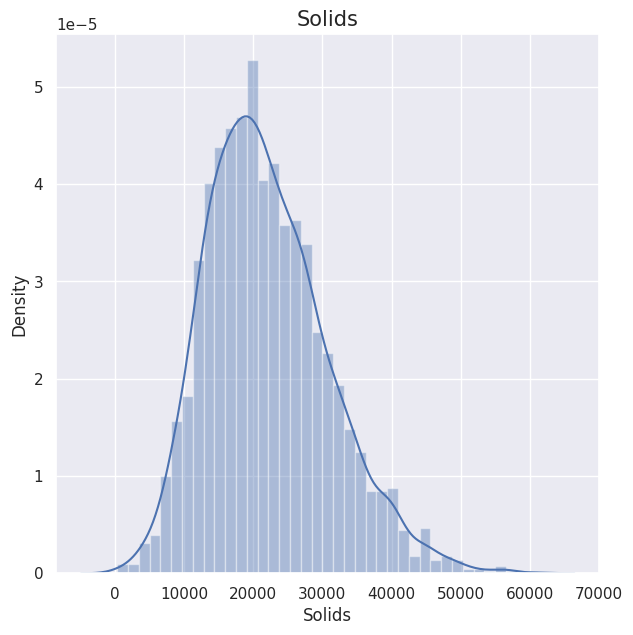

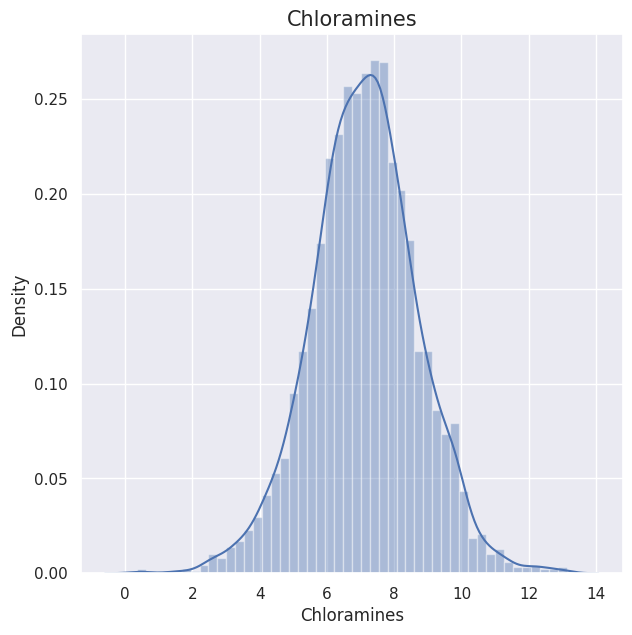

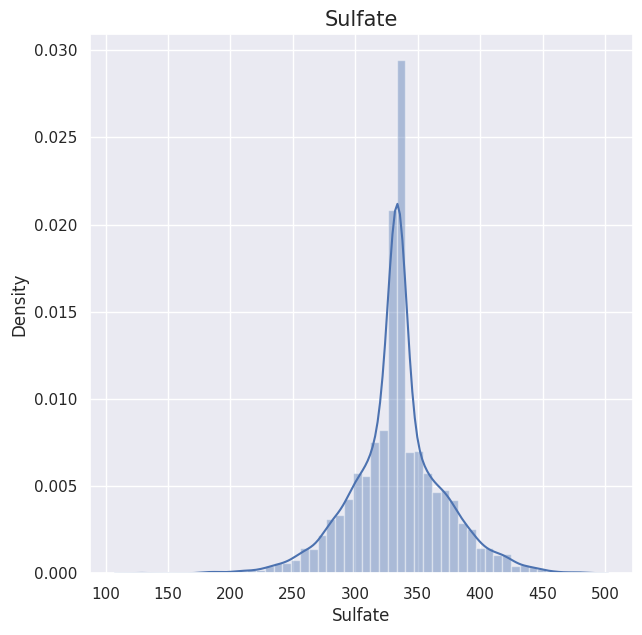

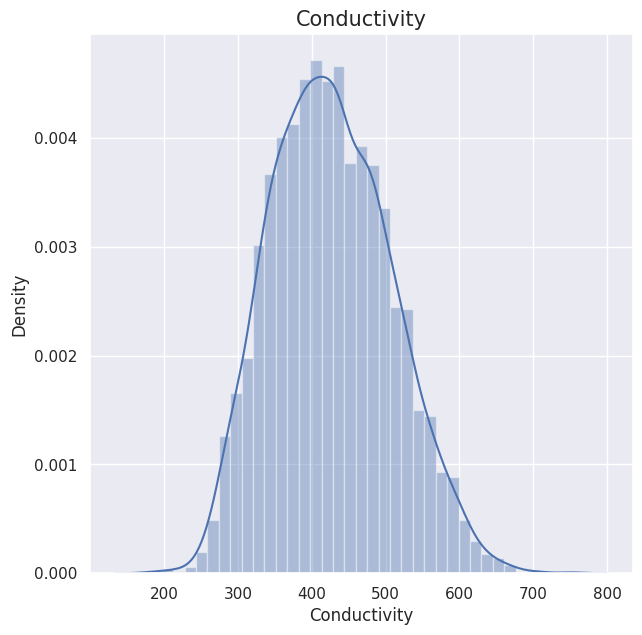

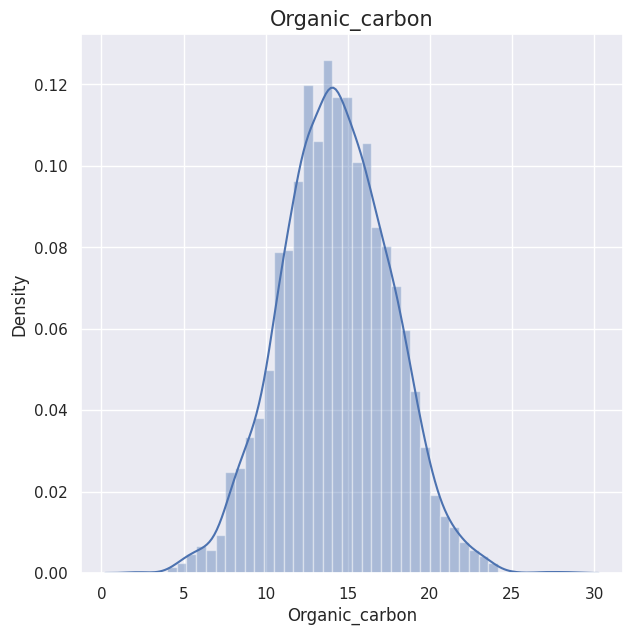

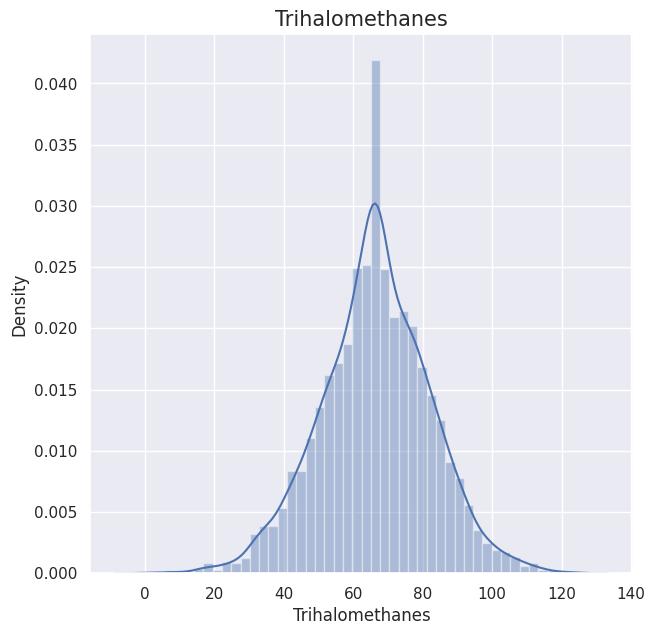

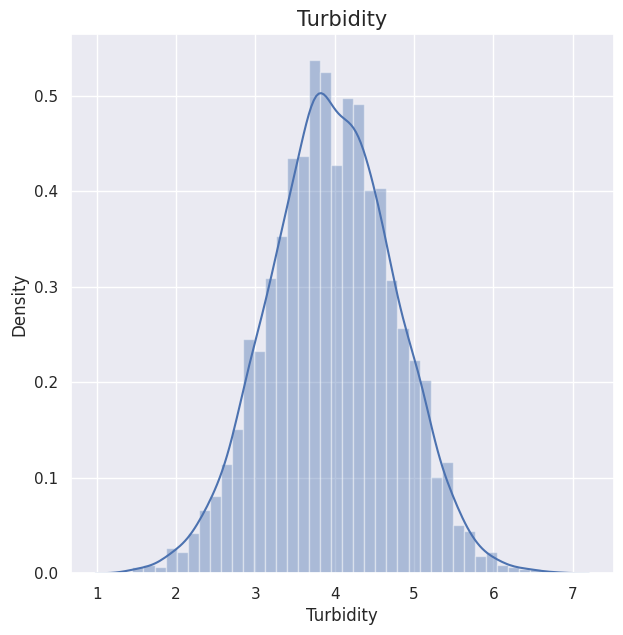

In [ ]:
for col in df.drop("Potability", axis=1).columns:
    plt.figure(figsize=(7,7))
    sns.distplot(df[col])
    plt.title(f"{col}", size=15)
    plt.show()

In [ ]:
labels = ['Not Potable','Potable']
values = [df[df["Potability"]==0].shape[0], df[df["Potability"]==1].shape[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=0.5, title="Potability")])
fig.show()

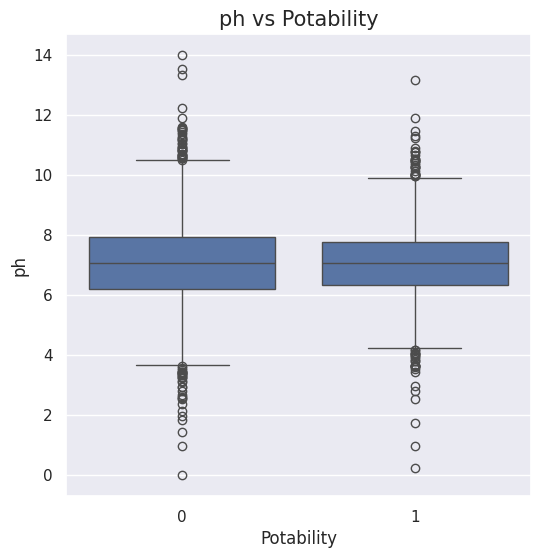

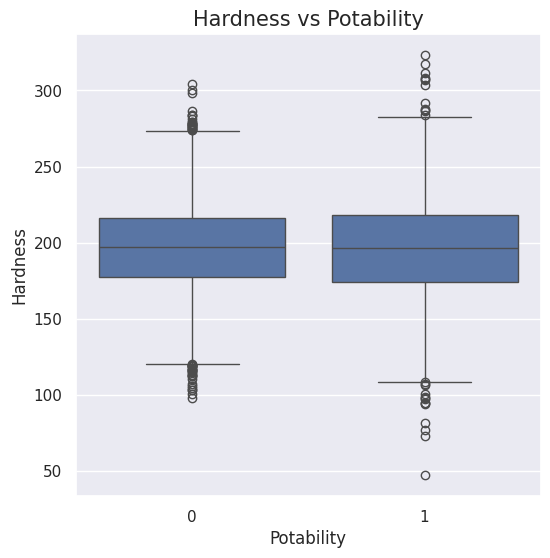

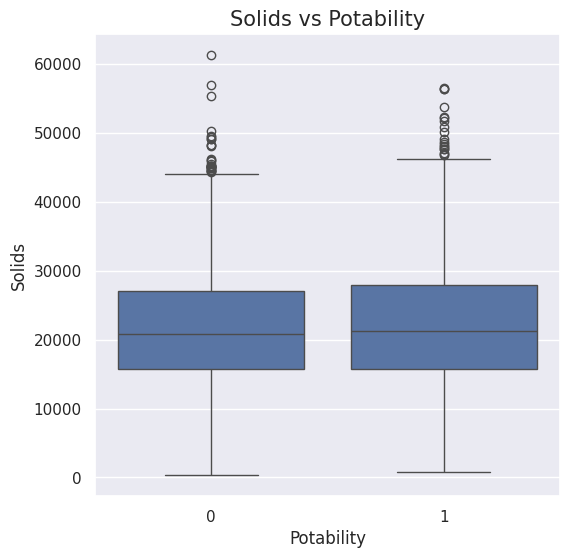

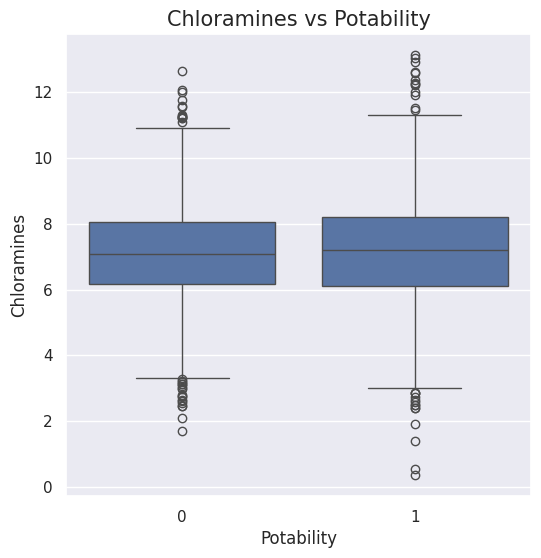

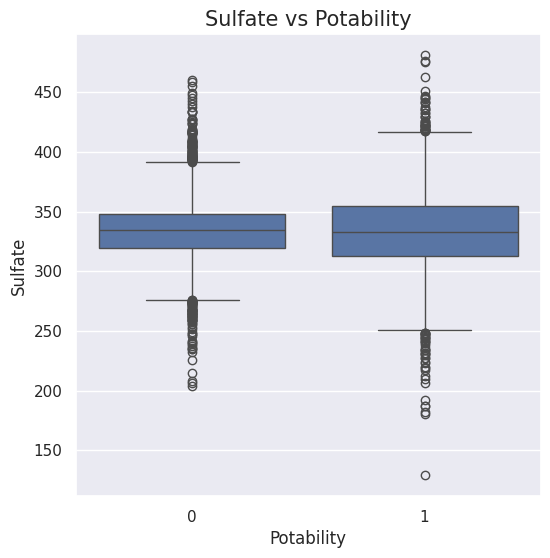

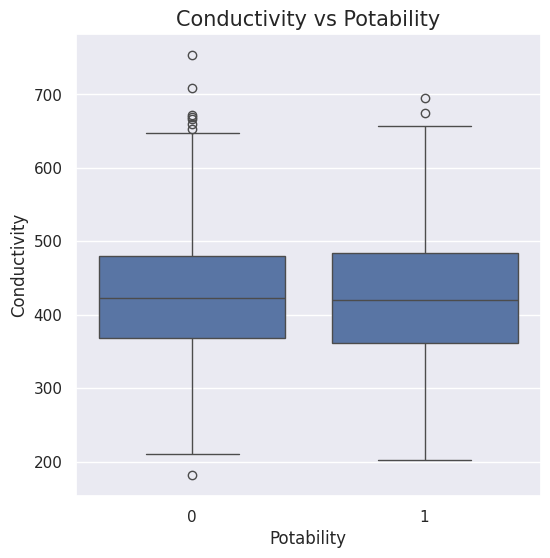

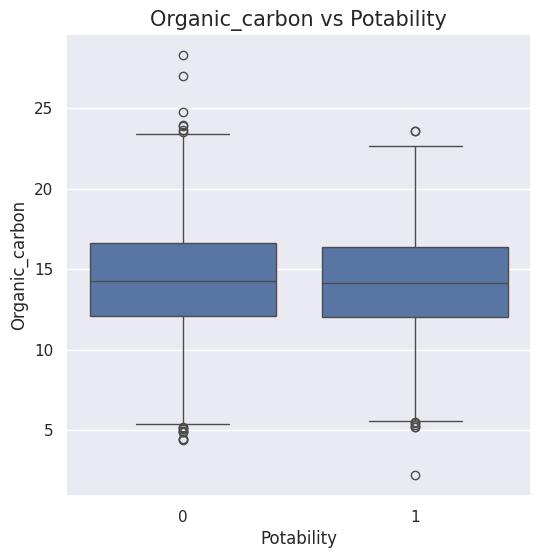

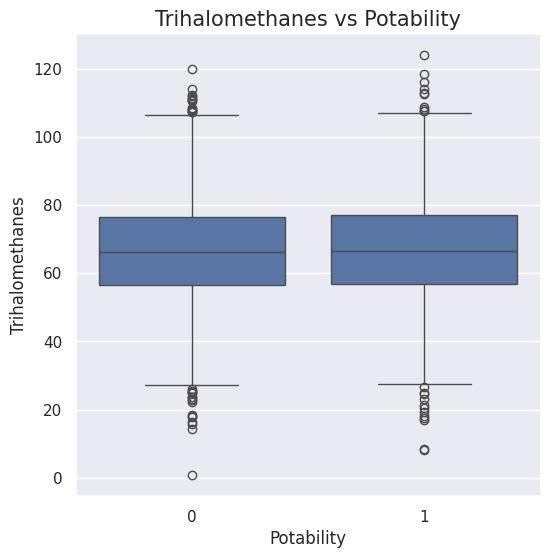

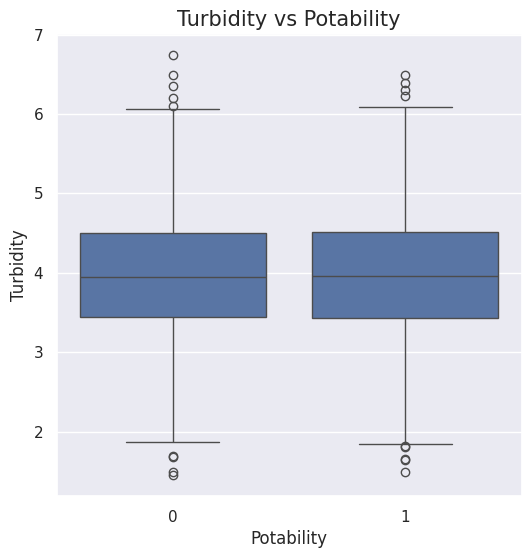

In [ ]:
for col in df.drop("Potability", axis=1).columns:
    plt.figure(figsize=(6,6))
    sns.boxplot(x="Potability", y=col,data=df)
    plt.title(f"{col} vs Potability", size=15)
    plt.show()

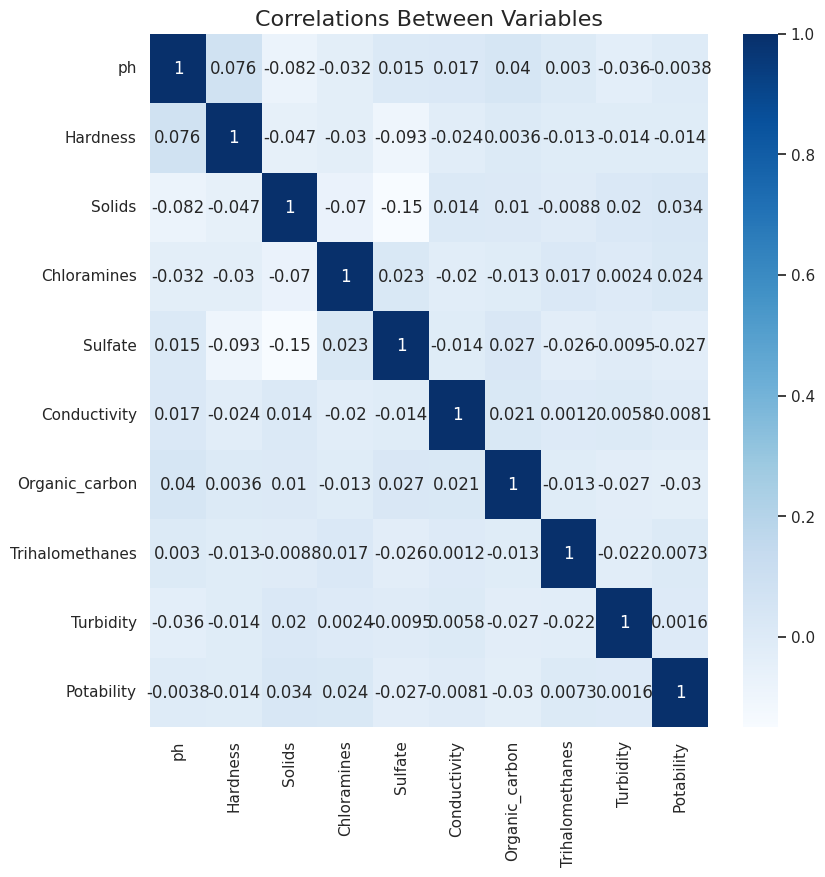

In [ ]:
plt.figure(figsize=(9, 9))
sns.heatmap(df.corr(), annot=True, cmap="Blues")
plt.title("Correlations Between Variables", size=16)
plt.show()

In [ ]:
X = df.drop("Potability", axis=1)
y = df["Potability"]

In [ ]:
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
models = pd.DataFrame(columns=["Model", "Accuracy Score"])

In [ ]:
model_list = [
    ("Logistic Regression", LogisticRegression(random_state=42)),
    ("Random Forest", RandomForestClassifier(random_state=42)),
    ("Support Vector Machines", SVC(random_state=42)),
    ("XGBoost", XGBClassifier(random_state=42)),
    ("Gaussian Naive Bayes", GaussianNB()),
    ("KNN", KNeighborsClassifier(n_neighbors=2)),
    ("Decision Tree", DecisionTreeClassifier(random_state=42)),
    ("Bagging Classifier", BaggingClassifier(estimator=RandomForestClassifier(), random_state=42))
]
# Initialize the models DataFrame
models = pd.DataFrame(columns=["Model", "Accuracy Score"])
# Loop through each model in the list
for name, clf in model_list:
    clf.fit(X_train, y_train)
    predictions = clf.predict(X_test)
    score = accuracy_score(y_test, predictions)
    new_row = pd.DataFrame({"Model": [name], "Accuracy Score": [score]})
    models = pd.concat([models, new_row], ignore_index=True)
print(models)

                     Model  Accuracy Score
0      Logistic Regression        0.628049
1            Random Forest        0.824695
2  Support Vector Machines        0.699695
3                  XGBoost        0.792683
4     Gaussian Naive Bayes        0.631098
5                      KNN        0.663110
6            Decision Tree        0.746951
7       Bagging Classifier        0.806402


In [ ]:
models.sort_values(by="Accuracy Score", ascending=False)

,Model,Accuracy Score
1,Random Forest,0.824695
7,Bagging Classifier,0.806402
3,XGBoost,0.792683
6,Decision Tree,0.746951
2,Support Vector Machines,0.699695
5,KNN,0.663110
4,Gaussian Naive Bayes,0.631098
0,Logistic Regression,0.628049


In [ ]:
def visualize_roc_auc_curve(model, model_name):
    pred_prob = model.predict_proba(X_test)
    fpr, tpr, thresh = roc_curve(y_test, pred_prob[:, 1], pos_label=1)

    score = roc_auc_score(y_test, pred_prob[:, 1])

    plt.figure(figsize=(10,8))
    plt.plot(fpr, tpr, linestyle="--", color="orange", label="ROC AUC Score: (%0.5f)" % score)
    plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")

    plt.title(f"{model_name} ROC Curve", size=15)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right", prop={"size": 15})
    plt.show()

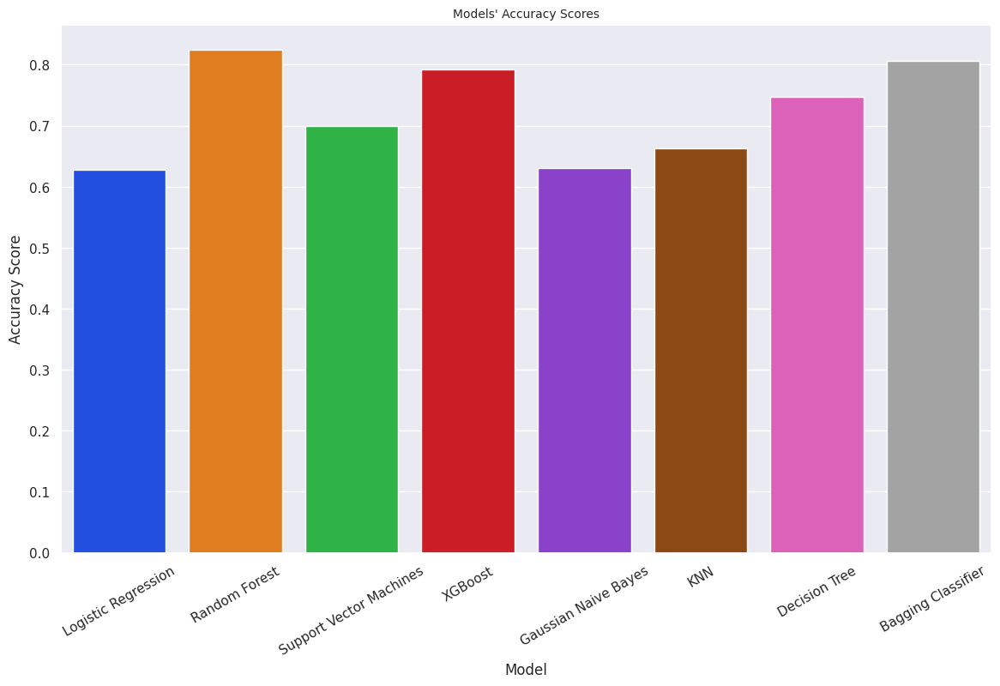

In [ ]:
plt.figure(figsize=(14, 8))
sns.barplot(x=models["Model"], y=models["Accuracy Score"],palette="bright")
plt.title("Models' Accuracy Scores", size=10)
plt.xticks(rotation=30)
plt.show()

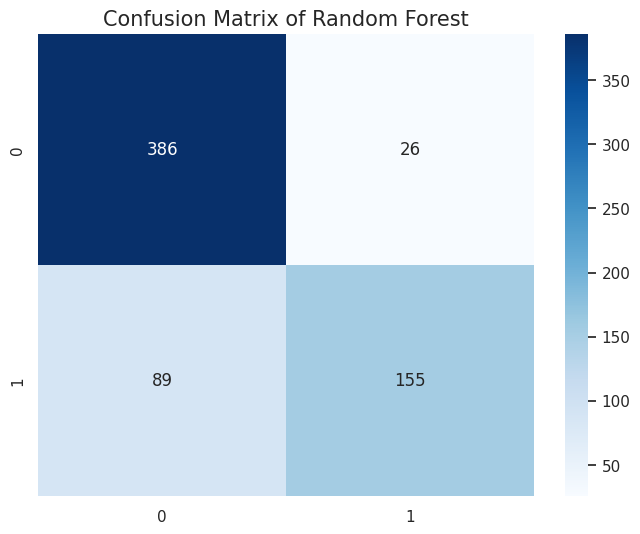

In [ ]:
rfc = RandomForestClassifier(random_state=42)
rfc.fit(X_train, y_train)
predictions = rfc.predict(X_test)

plt.figure(figsize=(8,6))
sns.heatmap(confusion_matrix(y_test, predictions), annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix of Random Forest", size=15)
plt.show()

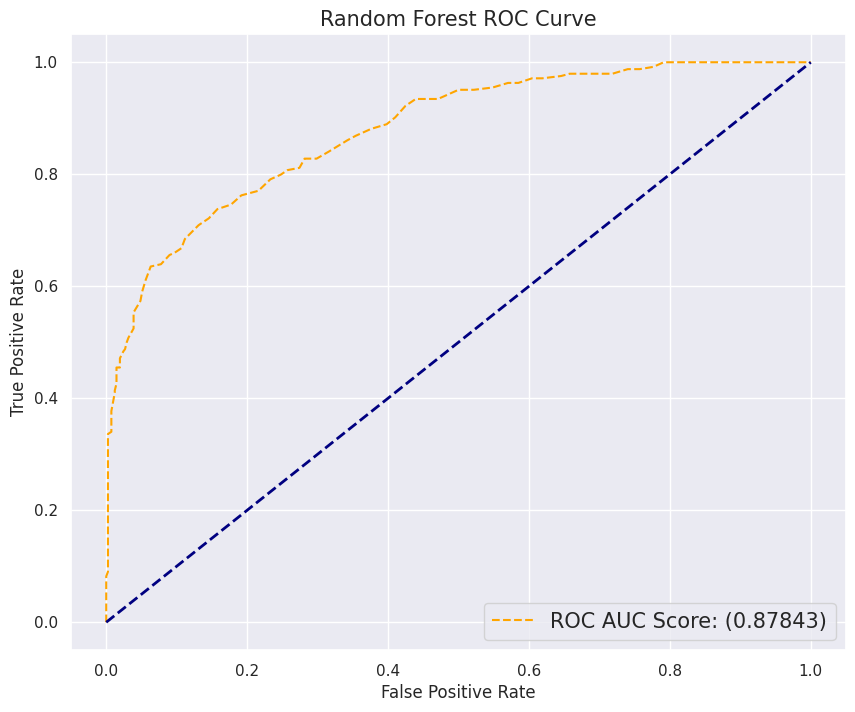

In [ ]:
visualize_roc_auc_curve(rfc, "Random Forest")

### ***Confusion Matrix and ROC Curve of Bagging Classifier***

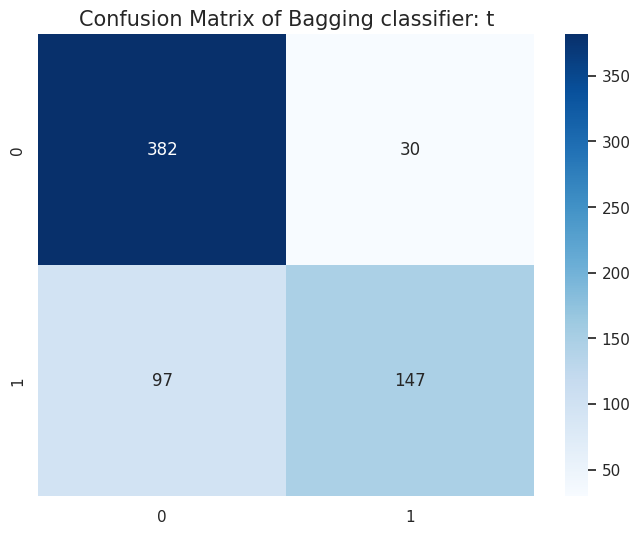

In [ ]:
bag = BaggingClassifier(estimator=RandomForestClassifier(), random_state=42)
bag.fit(X_train, y_train)
predictions = bag.predict(X_test)

plt.figure(figsize=(8,6))
sns.heatmap(confusion_matrix(y_test, predictions), annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix of Bagging classifier: t", size=15)
plt.show()

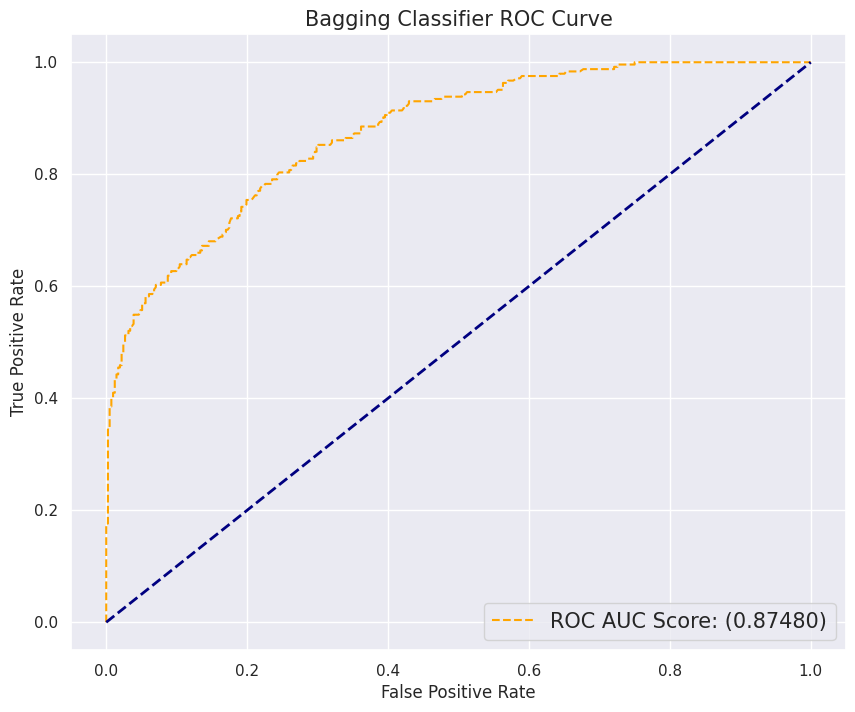

In [ ]:
visualize_roc_auc_curve(bag, "Bagging Classifier")

***Conclusion***:
**It can be observed that the model which yields the most accurate result is non-tuned Random Forest Classifier with an accuracy score of 0.824695. Bagging Classifier is another worthy-of-mention model.**